In [5]:
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.sparse import diags,eye
from scipy.sparse.linalg import spsolve
from scipy.optimize import root, root_scalar
from src.BloodVesselPeriodic import Grid1D, BloodVessel1Dperiodic

## 0. Grid
Esta parte deberia estar bien

In [6]:
L = 1.0
Np = 5
stretch = 1.1  # Equidistant grid

grid = Grid1D(L, Np, stretch, stretch_type='test')

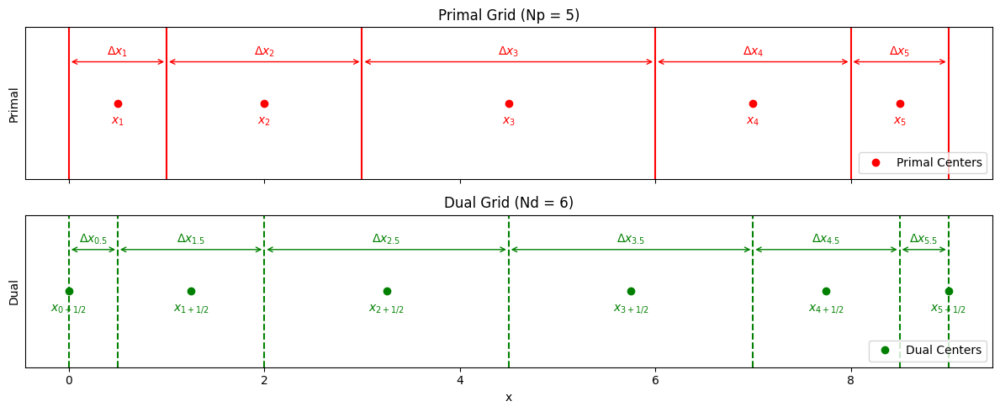

In [7]:
fig, axs = plt.subplots(2, 1, figsize=(12, 5), sharex=True)

# PRIMAL GRID
axs[0].set_title(f"Primal Grid (Np = {Np})")
for x in grid.x_faces:
    axs[0].axvline(x, color='red')
axs[0].plot(grid.x_centers, np.zeros_like(grid.x_centers), 'ro', label='Primal Centers')
axs[0].set_yticks([])
axs[0].set_ylabel("Primal")

for i, xc in enumerate(grid.x_centers, start=1):
    axs[0].text(xc, -0.015, f"$x_{{{i}}}$", color='red', ha='center')

arrow_y = 0.03
for i in range(Np):
    start = grid.x_faces[i]
    end = grid.x_faces[i + 1]
    axs[0].annotate('', xy=(end, arrow_y), xytext=(start, arrow_y),
                    arrowprops=dict(arrowstyle='<->', color='red'))
    mid = 0.5 * (start + end)
    axs[0].text(mid, arrow_y + 0.005, f"$\Delta x_{{{i+1}}}$", color='red', ha='center')

axs[0].legend(loc='lower right')

# DUAL GRID
axs[1].set_title(f"Dual Grid (Nd = {Np + 1})")
for x in grid.x_dual_edges:
    axs[1].axvline(x, color='green', linestyle='--')
axs[1].plot(grid.x_dual_centers, np.zeros_like(grid.x_dual_centers), 'go', label='Dual Centers')
axs[1].set_yticks([])
axs[1].set_xlabel("x")
axs[1].set_ylabel("Dual")

for j, xd in enumerate(grid.x_dual_centers):
    i_label = j + 1
    axs[1].text(xd, -0.015, f"$x_{{{i_label-1}+1/2}}$", color='green', ha='center')

for i in range(len(grid.x_dual_edges) - 1):
    start = grid.x_dual_edges[i]
    end = grid.x_dual_edges[i + 1]
    axs[1].annotate('', xy=(end, arrow_y), xytext=(start, arrow_y),
                    arrowprops=dict(arrowstyle='<->', color='green'))
    mid = 0.5 * (start + end)
    i_label = i + 0.5
    axs[1].text(mid, arrow_y + 0.005, f"$\Delta x_{{{i_label}}}$", color='green', ha='center')

axs[1].legend(loc='lower right')
plt.tight_layout()
plt.show()

## 2nd test: Simplified Diffusive Problem with $A(x,t)=A_0$

The resulting diffusive problem is given by the partial differential equation:

$$
\frac{\partial q}{\partial t} - \frac{A_0}{\rho} \, \varphi(A_0) \, \frac{\partial^2 q}{\partial x^2} = 0,
$$

where $ q = q(x,t) $, $ A_0 $, $ \rho $, and $ \varphi(A_0) $ are constants.

---

### General solution with Fourier coefficients

The general solution can be expressed as a Fourier sine series:

$$
q(x,t) = \sum_{n=1}^\infty b_n \sin\left(\frac{n \pi x}{L}\right) \exp\left(- \Phi \left(\frac{n \pi}{L}\right)^2 t \right),
$$

where

$$
\Phi = \frac{A_0}{\rho} \varphi(A_0),
$$

and the coefficients $ b_n $ are determined by the initial condition $ q(x,0) $.

---

### Specific solution for the $n=2$ mode

Focusing on the mode with $n=2$, the solution reduces to:

$$
q(x,t) = \sin\left(\frac{2 \pi x}{L}\right) \exp\left(- \Phi \left(\frac{2 \pi}{L}\right)^2 t \right).
$$

In [ ]:
grid = Grid1D(L=1.0, Np=20, stretch_factor=1, stretch_type='uniform')

tF = 1.0
dt = 1e-4
A0ref = 1
L = 1

Tau = 1.0
rho = 1050

blood_solution = BloodVessel1Dperiodic(grid = grid, flux_type='kolgan', BC_type = "test_1",tF = tF, dt = dt, A0=A0ref, Tau = 1.0)
q_star_star_solutions, t_sol = blood_solution.test_diffusion()

dt =  0.0001 tF =  1.0


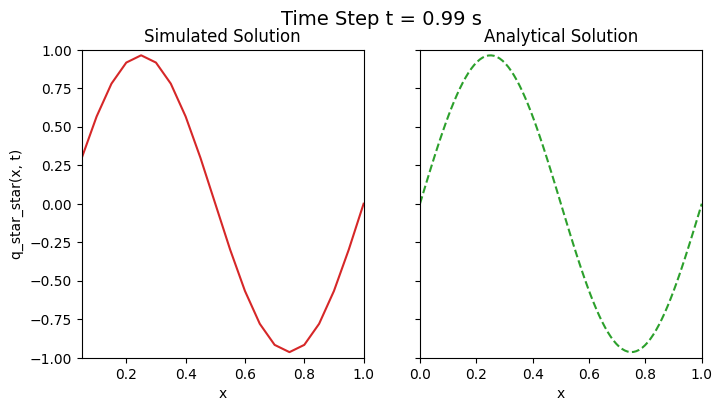

In [9]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

q_star_star_solutions = np.array(q_star_star_solutions )

# Constants and data
n_timesteps = len(q_star_star_solutions)
x_sim = np.linspace(grid.x_dual_centers[1], L, len(q_star_star_solutions[0]), endpoint=True)
x_ana = np.linspace(0, L, 100)

# Subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharey=True)

# Simulated plot
line_sim, = ax1.plot([], [], color='tab:red', label="Solution")
ax1.set_title('Simulated Solution')
ax1.set_xlabel('x')
ax1.set_ylabel('q_star_star(x, t)')
ax1.set_ylim([-1, 1])
ax1.set_xlim(x_sim.min(), 1)


# Analytical plot
line_ana, = ax2.plot([], [], '--', color='tab:green')
# line_ana2, = ax1.plot([], [], '--', color='tab:green')
ax2.set_title('Analytical Solution')
ax2.set_xlabel('x')
ax2.set_xlim(x_ana.min(), x_ana.max())
ax2.set_ylim([-1, 1])

div = 100

def get_q_analytical(t):
    phi_val = Tau / (A0ref**1.5)
    phi_val *= A0ref / rho
    
    q_vals = np.zeros_like(x_ana)
    for i, x in enumerate(x_ana):
        q_vals[i] = np.sin(2*np.pi * x / L) * np.exp(-phi_val * (2*np.pi / L)**2 * t)
    
    return q_vals

# Update function for animation
def update(t):
    y_sim = q_star_star_solutions[div*t]

    y_ana = get_q_analytical(t_sol[div*t])

    line_sim.set_data(x_sim, y_sim)
    line_ana.set_data(x_ana, y_ana)
    # line_ana2.set_data(x_ana, y_ana)

    fig.suptitle(f"Time Step t = {t_sol[div*t]:.2f} s", fontsize=14)
    return line_sim, line_ana


ani = FuncAnimation(fig, update, frames=int(n_timesteps/div), blit=True)
HTML(ani.to_jshtml())

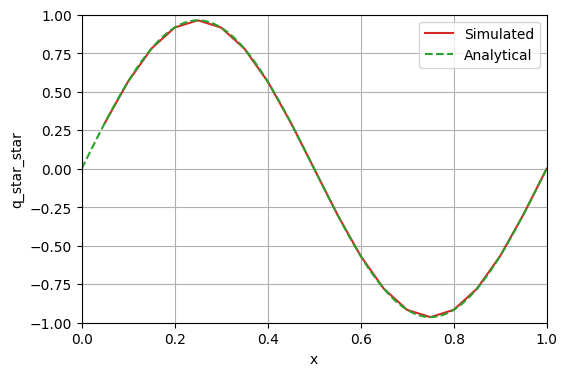

In [10]:
q_star_star_solutions = np.array(q_star_star_solutions)

# Constants and data
n_timesteps = len(q_star_star_solutions)
x_sim = np.linspace(grid.x_dual_centers[1], L, len(q_star_star_solutions[0]), endpoint=True)
x_ana = np.linspace(0, L, 100)

# Plots
fig, ax = plt.subplots(figsize=(6, 4))

# Simulated and analytical lines on same axis
line_sim, = ax.plot([], [], color='tab:red', label="Simulated")
line_ana, = ax.plot([], [], '--', color='tab:green', label="Analytical")

# Formatting
# ax.set_title('q_star_star(x, t)')
ax.set_xlabel('x')
ax.set_ylabel('q_star_star')
ax.set_xlim(0, 1)
ax.set_ylim(-1, 1)
ax.grid(True)
ax.legend()

div = 100

def get_q_analytical(t):
    phi_val = Tau / (A0ref**1.5)
    phi_val *= A0ref / rho
    
    return np.sin(2 * np.pi * x_ana / L) * np.exp(-phi_val * (2 * np.pi / L)**2 * t)

# Update function for animation
def update(frame):
    t = t_sol[frame * div]
    y_sim = q_star_star_solutions[frame * div]
    y_ana = get_q_analytical(t)

    line_sim.set_data(x_sim, y_sim)
    line_ana.set_data(x_ana, y_ana)

    # ax.set_title(f'Solution of  at t = {t:.2f} s')
    return line_sim, line_ana

ani = FuncAnimation(fig, update, frames=int(n_timesteps / div), blit=True)
HTML(ani.to_jshtml())

In [11]:
stretch = 1
Np_list = [10, 15, 25, 40, 50, 75, 100, 150, 200]
# Np_list = [10, 30, 50, 75, 100, 150, 175, 200]

L2_errors = []

def analytical_q(x_vals, t):
    phi_val = Tau / (A0ref**1.5)
    phi_val *= A0ref / rho
    
    q_vals = np.sin(2 * np.pi * x_vals / L) * np.exp(-phi_val * (2 * np.pi / L)**2 * t)
    
    return q_vals

# --- Convergence loop ---
for Np in Np_list:
    print(f"Running simulation for Np = {Np}")

    grid = Grid1D(L=L, Np=Np, stretch_factor=stretch, stretch_type='uniform')

    blood_solution = BloodVessel1Dperiodic(
        grid=grid, flux_type='kolgan', BC_type="test_1",
        tF=tF, dt=dt, A0=A0ref, Tau = Tau
    )

    q_star_star_solutions, t_sol = blood_solution.test_diffusion()
    
    # Numerical solution at final time
    q_numerical = q_star_star_solutions[-1]  # Shape: (Np,)
    x_vals = np.linspace(grid.x_dual_centers[1], L, len(q_star_star_solutions[0]), endpoint=True) # Assuming your Grid1D has .x for grid points
    
    # Analytical solution at final time
    q_exact = analytical_q(x_vals, tF)

    # L2 norm of the error (ignoring nan from root solver)
    mask = ~np.isnan(q_exact)
    L2_error = np.sqrt(np.sum((q_numerical[mask] - q_exact[mask])**2) / np.sum(mask))
    L2_errors.append(L2_error)

Running simulation for Np = 10
dt =  0.0001 tF =  1.0
Running simulation for Np = 15
dt =  0.0001 tF =  1.0
Running simulation for Np = 25
dt =  0.0001 tF =  1.0
Running simulation for Np = 40
dt =  0.0001 tF =  1.0
Running simulation for Np = 50
dt =  0.0001 tF =  1.0
Running simulation for Np = 75
dt =  0.0001 tF =  1.0
Running simulation for Np = 100
dt =  0.0001 tF =  1.0
Running simulation for Np = 150
dt =  0.0001 tF =  1.0
Running simulation for Np = 200
dt =  0.0001 tF =  1.0


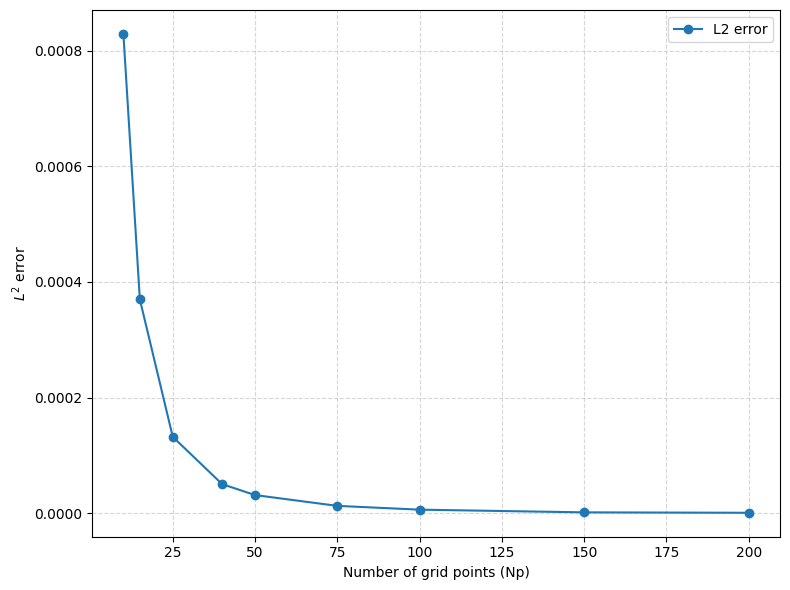

In [12]:
# --- Plot convergence ---
plt.figure(figsize=(8,6))
plt.plot(Np_list, L2_errors, 'o-', label=r'L2 error')
plt.xlabel('Number of grid points (Np)')
plt.ylabel(r'$L^2$ error')
# plt.title('Convergence of numerical solution for diffusive problem')
plt.grid(True, which='both', ls='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

In [13]:
log_Np = np.log10(Np_list[:-2])

log_L2 = np.log10(L2_errors[:-2])
slope, intcpt = np.polyfit(log_Np, log_L2, 1)
fit_line = 10**(intcpt + slope * np.log10(Np_list))

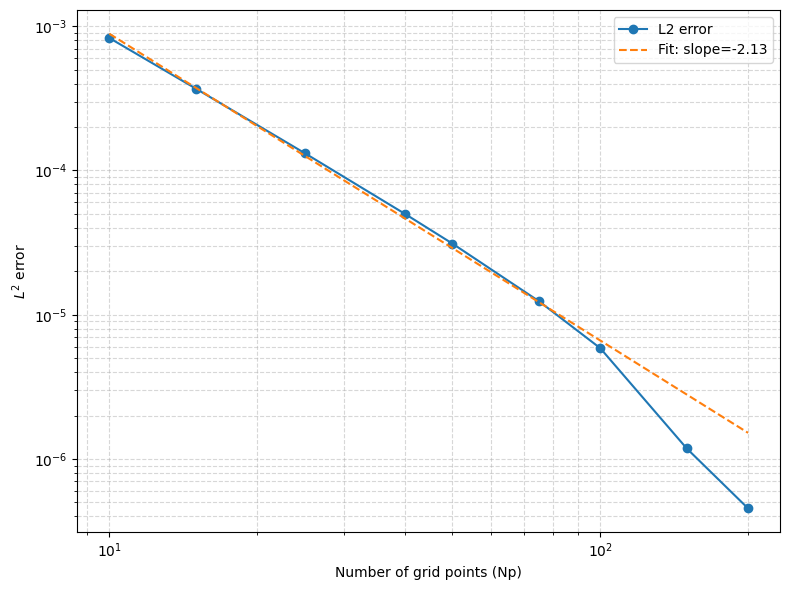

In [17]:
plt.figure(figsize=(8,6))
plt.loglog(Np_list, L2_errors, 'o-', label=r'L2 error')
plt.loglog(Np_list, fit_line, '--', label=f'Fit: slope={slope:.2f}')
plt.xlabel('Number of grid points (Np)')
plt.ylabel(r'$L^2$ error')
# plt.title('Convergence of numerical solution for diffusive problem')
plt.grid(True, which='both', ls='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()